### Topic: Harnessing AI for Canine Emotion Recognition: An Exploration using Convolutional Neural Networks and Transfer Learning Models

This study investigated the effectiveness of artificial intelligence models in classifying dog emotions using visual cues. We used a dataset of labeled dog images and experimented with various architectures, including the foundational CNN and transfer learning models such as ResNet 50, VGG16, MobileNet V2, and DenseNet 121.
The results showed that DenseNet 121 achieved the best accuracy of 82.63% on the test data. This suggests that DenseNet 121 is a promising model for dog emotion classification.
The findings of this study have implications for the development of pet care and animal-assisted therapies. However, the limited size of the dataset used in this study limits the generalizability of the results. Future research should address this limitation by using larger dataset


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import os
import cv2
import numpy as np
import pandas as pd
import shutil
import random
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
# from PIL import Image

import tensorflow as tf
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Dropout, Flatten, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam, RMSprop
from sklearn.metrics import classification_report, confusion_matrix

from keras.applications import ResNet50
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.applications import MobileNetV2

from tensorflow.keras import backend
import itertools

In [3]:
# Define the input directory
input_dir = "/content/drive/MyDrive/Dogs/dog_emotion"
base_dir = "/content/drive/MyDrive/Dogs/splits"

In [4]:
# Function to create directories if they don't exist
def create_directory(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)

In [5]:
# Function to determine if a file is an image
def is_image(filename):
    valid_extensions = ['jpg', 'jpeg', 'png', 'bmp', 'tiff', 'gif'] # Add/remove extensions as needed
    file_extension = filename.split('.')[-1].lower()
    return file_extension in valid_extensions

In [6]:
# Function to split data into train, validation, and test sets
def split_data(category_dir, category):
    # Define the directories
    train_dir = os.path.join(base_dir, "train", category)
    val_dir = os.path.join(base_dir, "val", category)
    test_dir = os.path.join(base_dir, "test", category)

    # Create the directories if they don't exist
    create_directory(train_dir)
    create_directory(val_dir)
    create_directory(test_dir)

     # List all the image files in the category
    image_files = [os.path.join(category_dir, f) for f in os.listdir(category_dir) if is_image(f)]

    # Shuffle the images
    random.shuffle(image_files)

    # Split the data
    num_train = int(0.8 * len(image_files))
    num_val = int(0.10 * len(image_files))

    train_images = image_files[:num_train]
    val_images = image_files[num_train:num_train + num_val]
    test_images = image_files[num_train + num_val:]

    # Copy images to the respective directories
    for img_file in train_images:
        img = cv2.imread(img_file)
        img_res = cv2.resize(img, (200, 200)) # Assuming you still want to resize them to 200x200
        img_name = os.path.basename(img_file)
        cv2.imwrite(os.path.join(train_dir, img_name), img_res)

    for img_file in val_images:
        img = cv2.imread(img_file)
        img_res = cv2.resize(img, (200, 200))
        img_name = os.path.basename(img_file)
        cv2.imwrite(os.path.join(val_dir, img_name), img_res)

    for img_file in test_images:
        img = cv2.imread(img_file)
        img_res = cv2.resize(img, (200, 200))
        img_name = os.path.basename(img_file)
        cv2.imwrite(os.path.join(test_dir, img_name), img_res)

# Given emotions (classes)
emotions = ["angry", "happy", "sad", "relaxed"]

# Splitting the data for each emotion
for emotion in emotions:
    emotion_dir = os.path.join(input_dir, emotion)
    split_data(emotion_dir, emotion)

In [7]:
# Read number of images in each class
def count_images_in_classes(input_dir, classes):
    counts = {}
    for cls in classes:
        cls_dir = os.path.join(input_dir, cls)
        counts[cls] = len([f for f in os.listdir(cls_dir) if os.path.isfile(os.path.join(cls_dir, f))])
    return counts

# Given emotions (classes)
emotions = ["angry", "happy", "sad", "relaxed"]

# Counting images
image_counts = count_images_in_classes(input_dir, emotions)
for emotion, count in image_counts.items():
    print(f"Number of {emotion} images: {count}")

Number of angry images: 1000
Number of happy images: 1000
Number of sad images: 1000
Number of relaxed images: 1000


### Visualizations

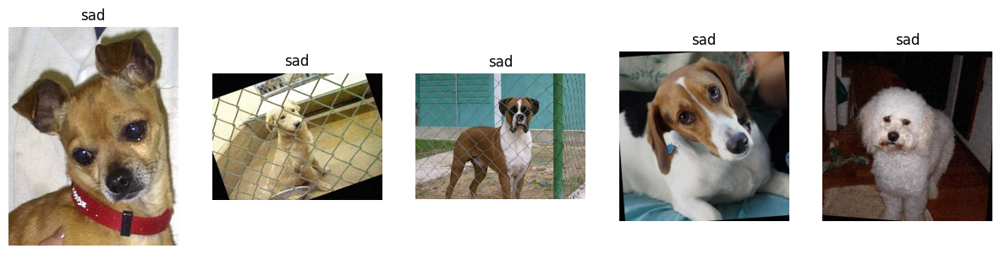

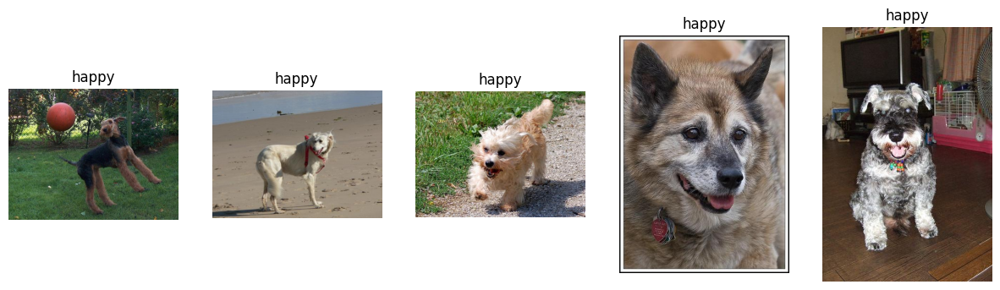

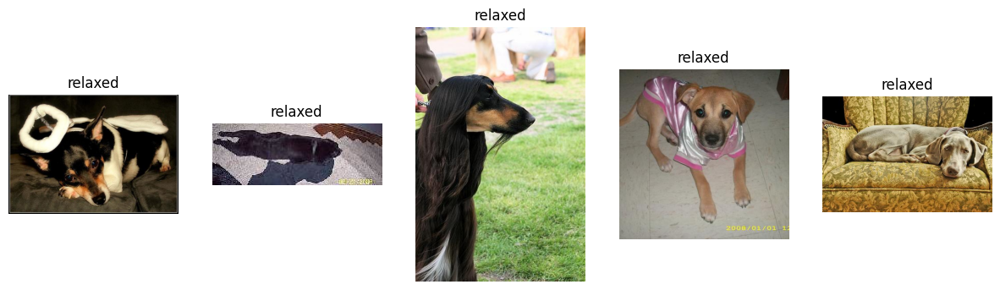

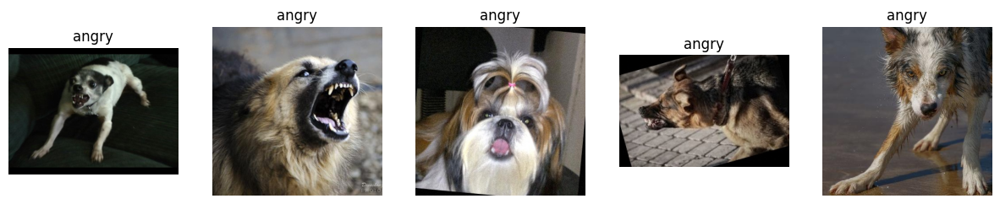

In [8]:
# Visualize images

base_dir = "D:\Dog Emotion Dataset"

# Get the class names (sub-folder names)
categories = [d for d in os.listdir(input_dir) if os.path.isdir(os.path.join(input_dir, d))]

def display_sample_images(input_dir, categories, num_samples=5):
    for category in categories:
        img_dir = os.path.join(input_dir, category)
        image_files = [os.path.join(img_dir, f) for f in os.listdir(img_dir) if os.path.isfile(os.path.join(img_dir, f))]
        sample_images = random.sample(image_files, num_samples)

        plt.figure(figsize=(15, 5))
        for i, img_file in enumerate(sample_images):
            img = cv2.imread(img_file)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            plt.subplot(1, num_samples, i + 1)
            plt.imshow(img)
            plt.title(category)
            plt.axis("off")

        # Save the plot as an image file
        plt.savefig(f"{category}_dog_emotion_images.png", bbox_inches='tight')
        plt.show()

display_sample_images(input_dir, categories)

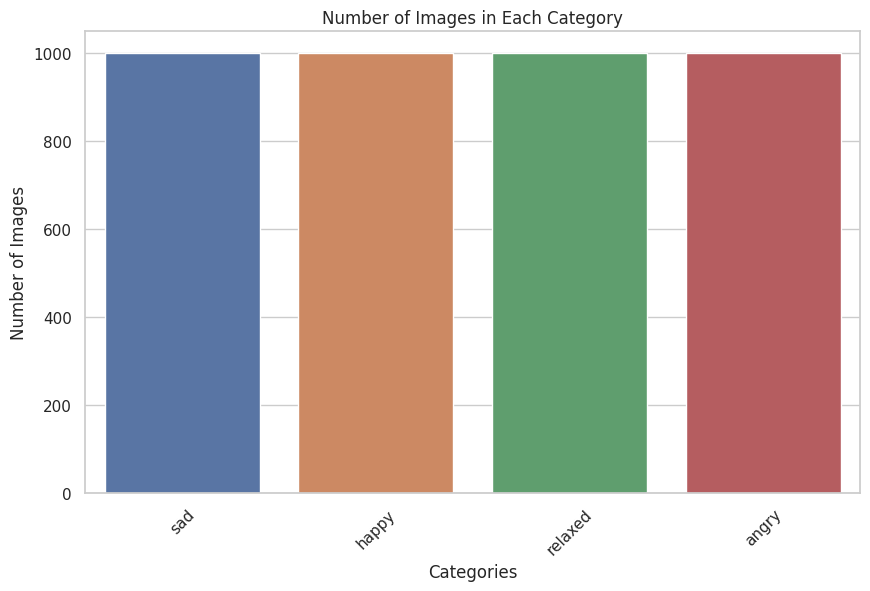

In [9]:
# Plotting the classes
def plot_image_counts(input_dir, categories):
    # Create a count plot showing the number of images in each category
    image_counts = [len(os.listdir(os.path.join(input_dir, category))) for category in categories]
    plt.figure(figsize=(10, 6))
    sns.set(style="whitegrid")
    ax = sns.barplot(x=categories, y=image_counts)
    ax.set(xlabel="Categories", ylabel="Number of Images")
    plt.xticks(rotation=45)
    plt.title("Number of Images in Each Category")

    # Save the count plot as an image file
    plt.savefig("image_counts.png", bbox_inches='tight')
    plt.show()

plot_image_counts(input_dir, categories)

### Preprocessing

In [10]:
train_path = "/content/drive/MyDrive/Dogs/splits/train"
test_path = "/content/drive/MyDrive/Dogs/splits/test"
val_path = "/content/drive/MyDrive/Dogs/splits/val"

#### Data generators 1

In [11]:
# Data generators
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255)

validation_datagen = ImageDataGenerator(
    rescale=1.0 / 255)

test_datagen = ImageDataGenerator(
    rescale=1.0 / 255)

In [12]:
batch_size =  64

# Load and preprocess training data
train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=(200, 200),
    batch_size=batch_size,
    class_mode='categorical')

Found 3200 images belonging to 4 classes.


In [13]:
# Load and preprocess validation data
validation_generator = validation_datagen.flow_from_directory(
    val_path,
    target_size=(200, 200),
    batch_size=batch_size,
    class_mode='categorical')

Found 400 images belonging to 4 classes.


In [14]:
# Load and preprocess test data
test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=(200, 200),
    batch_size=batch_size,
    class_mode='categorical')

Found 400 images belonging to 4 classes.


#### Data generators 2

In [15]:
# Define batch size
batch_size = 64

# Data augmentation configurations
train_data_gen = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 180,
    shear_range = 0.2,
    zoom_range = 0.2,
    width_shift_range = 0.1,
    height_shift_range = 0.1,
    horizontal_flip = True,
    vertical_flip = True,
    validation_split = 0.2,
    fill_mode = 'nearest',
    brightness_range=[0.8, 1.2])

test_data_gen = ImageDataGenerator(
    rescale = 1./255,
)


In [16]:
# Create data generators for train, validation, and test data
train_generator1 = train_data_gen.flow_from_directory(
    train_path,  # Path to the directory containing your training images
    target_size=(200, 200),  # Target size of input images
    batch_size=batch_size,
    class_mode='categorical',  # Assuming you're using categorical labels
    subset='training')  # Training subset

Found 2560 images belonging to 4 classes.


In [17]:
validation_generator1 = train_data_gen.flow_from_directory(
    train_path,  # Path to the directory containing your training images
    target_size=(200, 200),  # Target size of input images
    batch_size=batch_size,
    class_mode='categorical',  # Assuming you're using categorical labels
    subset='validation',  # Validation subset
    shuffle=False)

Found 640 images belonging to 4 classes.


In [18]:
# Data normalization for test and validation data (no augmentation)
val_test_datagen = ImageDataGenerator(rescale=1.0/255)

val_generator1 = val_test_datagen.flow_from_directory(
    val_path,  # Path to the directory containing your validation images
    target_size=(200, 200),  # Target size of input images
    batch_size=batch_size,
    class_mode='categorical')  # Assuming you're using categorical labels

Found 400 images belonging to 4 classes.


In [19]:
test_generator1 = val_test_datagen.flow_from_directory(
    test_path,  # Path to the directory containing your test images
    target_size=(200, 200),  # Target size of input images
    batch_size=batch_size,
    class_mode='categorical')  # Assuming you're using categorical labels

Found 400 images belonging to 4 classes.


In [20]:
# Set the metrics
METRICS = [
      tf.keras.metrics.BinaryAccuracy(name='accuracy'),
      tf.keras.metrics.Precision(name='precision'),
      tf.keras.metrics.Recall(name='recall'),
      tf.keras.metrics.AUC(name='auc')
]

In [21]:
# Define your loss and accuracy curves
def visualize_learning(hist, save_path=None):
    epochs_range = np.arange(1, len(hist.history['loss']) + 1)
    plt.style.use('ggplot')

    # Create a 1x2 grid of plots
    fig, (loss_axis, accuracy_axis) = plt.subplots(nrows=1, ncols=2, figsize=(14, 5))

    # Plotting loss on the left subplot
    loss_axis.plot(epochs_range, hist.history['loss'], 'r--o', label='Train Loss')
    loss_axis.plot(epochs_range, hist.history['val_loss'], 'b--o', label='Validation Loss')
    loss_axis.set_title('Epoch vs. Loss')
    loss_axis.set_xlabel('Epochs')
    loss_axis.set_ylabel('Loss Value')
    loss_axis.legend(loc='upper right')

    # Plotting accuracy on the right subplot
    accuracy_axis.plot(epochs_range, hist.history['accuracy'], 'r--o', label='Train Accuracy')
    accuracy_axis.plot(epochs_range, hist.history['val_accuracy'], 'b--o', label='Validation Accuracy')
    accuracy_axis.set_title('Epoch vs. Accuracy')
    accuracy_axis.set_xlabel('Epochs')
    accuracy_axis.set_ylabel('Accuracy Value')
    accuracy_axis.legend(loc='lower right')

    plt.tight_layout()

    # Save the plot if a path is provided
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)

    plt.show()

In [22]:
# Define the confusion matrix

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion Matrix', cmap=plt.cm.rainbow):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.rcParams["figure.figsize"] = (6, 4)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print('Normalized confusion matrix')
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment='center',
                 color='white' if cm[i, j] > thresh else 'black')

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

#### Architecture 1

In [23]:
# define model architecture
base_model = Sequential()

# The Input Layer :
# First convolutional block
base_model.add(Conv2D(128, (3,3), activation = "relu", padding="same", input_shape = (200, 200, 3)))# 32 is filters
base_model.add(MaxPooling2D((2,2)))

# The Hidden Layers :
# Second convolutional block
base_model.add(Conv2D(64,(3,3), activation = "relu"))
base_model.add(MaxPooling2D((2,2)))

# Third convolutional block
base_model.add(Conv2D(32,(3,3), activation = "relu"))
base_model.add(MaxPooling2D((2,2)))

# flattening the output of the conv layer after max pooling to make it ready for creating dense connections
# Fully connected layers
base_model.add(Flatten())
base_model.add(Dense(32, activation = "relu"))# 100 = neurons
base_model.add(Dropout(0.3))

# The Output Layer :
base_model.add(Dense(4, activation= "softmax"))

In [24]:
base_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 200, 200, 128)     3584      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 100, 100, 128)    0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 98, 98, 64)        73792     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 49, 49, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 47, 47, 32)        18464     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 23, 23, 32)       0

In [25]:
# Compile the model
learning_rate = 0.001
optimizer = Adam(learning_rate=learning_rate)
base_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=METRICS)

In [26]:
# Define model checkpoint and early stopping
model_filename = "/content/drive/MyDrive/Dogs/Models/dog_0_model.hdf5"
chkpt_0 = ModelCheckpoint(model_filename, save_best_only=True, verbose=2)

# define early stopping layer
es = EarlyStopping(patience=3, monitor="val_loss", mode="min", verbose=2)

In [27]:
# Train the model
epochs = 30
history = base_model.fit(train_generator,
                    epochs=epochs,
                    steps_per_epoch=train_generator.samples // batch_size,
                    validation_data=validation_generator,
                    validation_steps=validation_generator.samples // batch_size,
                    callbacks=[chkpt_0, es])

Epoch 1/30
50/50 [==============================] - ETA: 0s - loss: 1.3826 - accuracy: 0.7486 - precision: 0.3269 - recall: 0.0053 - auc: 0.5464
Epoch 1: val_loss improved from inf to 1.32006, saving model to /content/drive/MyDrive/Dogs/Models/dog_0_model.hdf5
50/50 [==============================] - 22s 303ms/step - loss: 1.3826 - accuracy: 0.7486 - precision: 0.3269 - recall: 0.0053 - auc: 0.5464 - val_loss: 1.3201 - val_accuracy: 0.7500 - val_precision: 0.5000 - val_recall: 0.0078 - val_auc: 0.6606
Epoch 2/30
50/50 [==============================] - ETA: 0s - loss: 1.2938 - accuracy: 0.7510 - precision: 0.5184 - recall: 0.0572 - auc: 0.6480
Epoch 2: val_loss improved from 1.32006 to 1.28865, saving model to /content/drive/MyDrive/Dogs/Models/dog_0_model.hdf5
50/50 [==============================] - 12s 231ms/step - loss: 1.2938 - accuracy: 0.7510 - precision: 0.5184 - recall: 0.0572 - auc: 0.6480 - val_loss: 1.2887 - val_accuracy: 0.7546 - val_precision: 0.6207 - val_recall: 0.0469 

In [28]:
# Evaluate the model using the test generator
evaluation_results = base_model.evaluate(test_generator, verbose=1)

7/7 [==============================] - 1s 199ms/step - loss: 1.5327 - accuracy: 0.7387 - precision: 0.4587 - recall: 0.2500 - auc: 0.6656


In [29]:
# Create a DataFrame from the history object
history_df = pd.DataFrame(history.history)

# Print the DataFrame
history_df

,loss,accuracy,precision,recall,auc,val_loss,val_accuracy,val_precision,val_recall,val_auc
0,1.382571,0.748594,0.326923,0.005313,0.546403,1.320064,0.750000,0.500000,0.007812,0.660626
1,1.293768,0.751016,0.518414,0.057188,0.647954,1.288654,0.754557,0.620690,0.046875,0.647519
2,1.238927,0.756250,0.578125,0.092500,0.690778,1.287357,0.751302,0.525000,0.054688,0.654412
3,1.187631,0.766484,0.642375,0.148750,0.724864,1.287320,0.754557,0.553846,0.093750,0.654514
4,1.074191,0.786094,0.693144,0.259062,0.785963,1.344792,0.744141,0.465649,0.158854,0.643842
5,0.942597,0.813594,0.735260,0.397500,0.839918,1.416671,0.725260,0.389535,0.174479,0.638017
6,0.763296,0.852578,0.801839,0.545000,0.898600,1.580808,0.727214,0.412060,0.213542,0.638549


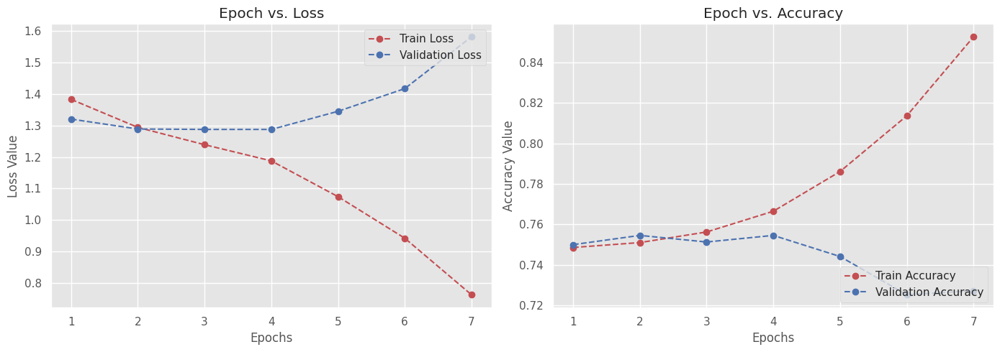

In [30]:
# Plot the accuracy and loss curves
visualize_learning(history, save_path='/content/drive/MyDrive/Dogs/learning_curves/base_model_learning_curves.png')

In [31]:
predictor = base_model.predict(x = test_generator, verbose=0)
predictor = np.argmax(predictor, axis = 1)

Confusion matrix, without normalization
[[28 26 19 27]
 [18 27 27 28]
 [29 26 23 22]
 [25 24 20 31]]


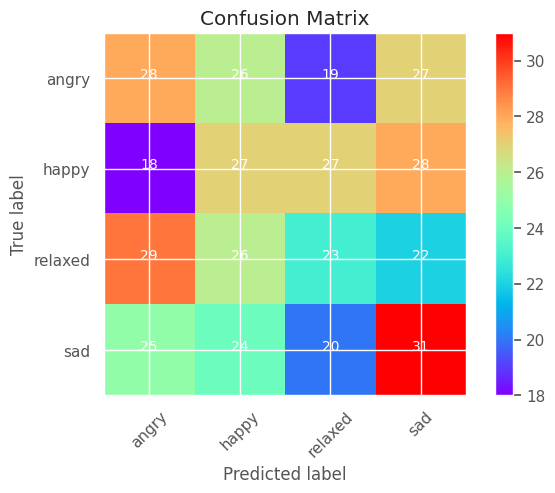

In [32]:
# Compute the confusion matrix
true_labels = test_generator.classes
bas_model = confusion_matrix(true_labels, predictor)

# Define the class labels
labels = ['angry', 'happy', 'relaxed', 'sad']

# Plot the confusion matrix
plot_confusion_matrix(cm=bas_model, classes=labels)

In [33]:
print(classification_report(test_generator.classes,predictor, target_names=labels))

              precision    recall  f1-score   support

       angry       0.28      0.28      0.28       100
       happy       0.26      0.27      0.27       100
     relaxed       0.26      0.23      0.24       100
         sad       0.29      0.31      0.30       100

    accuracy                           0.27       400
   macro avg       0.27      0.27      0.27       400
weighted avg       0.27      0.27      0.27       400



In [34]:
# Clearing backend
from tensorflow.keras import backend
backend.clear_session()

# Fixing the seed for random number generators
import random
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

#### Architecture 2
Dropout rate changed to 0.5, and augmenting

In [35]:
# define model architecture
augmented_model = Sequential()

# The Input Layer :
# First convolutional block
augmented_model.add(Conv2D(128, (3,3), activation = "relu", padding="same", input_shape = (200, 200, 3)))# 32 is filters
augmented_model.add(MaxPooling2D((2,2)))

# The Hidden Layers :
# Second convolutional block
augmented_model.add(Conv2D(64,(3,3), activation = "relu"))
augmented_model.add(MaxPooling2D((2,2)))

# Third convolutional block
augmented_model.add(Conv2D(32,(3,3), activation = "relu"))
augmented_model.add(MaxPooling2D((2,2)))

# flattening the output of the conv layer after max pooling to make it ready for creating dense connections
# Fully connected layers
augmented_model.add(Flatten())
augmented_model.add(Dense(32, activation = "relu"))# 100 = neurons
augmented_model.add(Dropout(0.5))

# The Output Layer :
augmented_model.add(Dense(4, activation= "softmax"))

In [36]:
augmented_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 200, 200, 128)     3584      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 100, 100, 128)    0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 98, 98, 64)        73792     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 49, 49, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 47, 47, 32)        18464     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 23, 23, 32)       0

In [37]:
# Compile the model
learning_rate = 0.0001
optimizer = Adam(learning_rate=learning_rate)
augmented_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=METRICS)

In [38]:
# Define model checkpoint and early stopping
model_filename = "/content/drive/MyDrive/Dogs/Models/dog_00_model.hdf5"
chkpt_00 = ModelCheckpoint(model_filename, save_best_only=True, verbose=2)

# define early stopping layer
es = EarlyStopping(patience=3, monitor="val_loss", mode="min", verbose=2)

In [39]:
# Train the model
epochs = 30
history = augmented_model.fit(train_generator1,
                    epochs=epochs,
                    steps_per_epoch=train_generator1.samples // batch_size,
                    validation_data=validation_generator1,
                    validation_steps=validation_generator1.samples // batch_size,
                    callbacks=[chkpt_00, es])

Epoch 1/30
40/40 [==============================] - ETA: 0s - loss: 1.3899 - accuracy: 0.7485 - precision: 0.4587 - recall: 0.0338 - auc: 0.5305
Epoch 1: val_loss improved from inf to 1.38419, saving model to /content/drive/MyDrive/Dogs/Models/dog_00_model.hdf5
40/40 [==============================] - 55s 1s/step - loss: 1.3899 - accuracy: 0.7485 - precision: 0.4587 - recall: 0.0338 - auc: 0.5305 - val_loss: 1.3842 - val_accuracy: 0.7500 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.5398
Epoch 2/30
40/40 [==============================] - ETA: 0s - loss: 1.3829 - accuracy: 0.7500 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5308
Epoch 2: val_loss improved from 1.38419 to 1.37967, saving model to /content/drive/MyDrive/Dogs/Models/dog_00_model.hdf5
40/40 [==============================] - 49s 1s/step - loss: 1.3829 - accuracy: 0.7500 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5308 - val_loss: 1.3797 - val_accuracy: 0.7500 - val_precision: 0.0000e+

In [40]:
# Evaluate the model using the test generator
evaluation_results = augmented_model.evaluate(test_generator1, verbose=1)

7/7 [==============================] - 1s 170ms/step - loss: 1.2337 - accuracy: 0.7581 - precision: 0.6757 - recall: 0.0625 - auc: 0.7060


In [41]:
# Create a DataFrame from the history object
history_df = pd.DataFrame(history.history)

# Print the DataFrame
history_df

,loss,accuracy,precision,recall,auc,val_loss,val_accuracy,val_precision,val_recall,val_auc
0,1.389886,0.748480,0.458716,0.033784,0.530460,1.384190,0.750000,0.000000,0.000000,0.539827
1,1.382866,0.750000,0.000000,0.000000,0.530830,1.379668,0.750000,0.000000,0.000000,0.541631
2,1.376040,0.750000,0.000000,0.000000,0.558033,1.363512,0.750000,0.000000,0.000000,0.597584
3,1.358091,0.749902,0.466667,0.002734,0.585094,1.348119,0.750000,0.000000,0.000000,0.614767
4,1.344151,0.749023,0.391304,0.007031,0.606783,1.329992,0.750000,0.000000,0.000000,0.626887
5,1.333967,0.748340,0.414141,0.016016,0.620904,1.325175,0.749219,0.416667,0.007812,0.631281
6,1.319663,0.749219,0.474026,0.028516,0.632074,1.321909,0.750391,1.000000,0.001563,0.636994
7,1.323773,0.747754,0.414815,0.021875,0.631774,1.307401,0.749219,0.428571,0.009375,0.649703
8,1.315651,0.746973,0.411429,0.028125,0.635352,1.310144,0.752344,0.687500,0.017188,0.646243
9,1.312363,0.750293,0.508287,0.035937,0.642291,1.300461,0.753125,0.681818,0.023438,0.651299


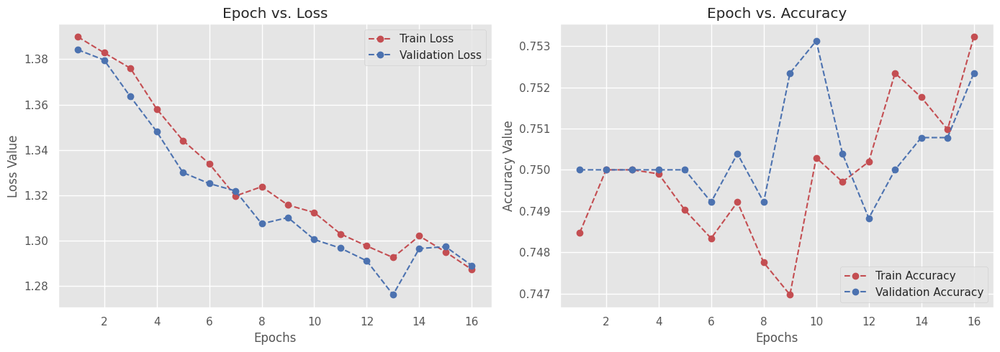

In [42]:
# Plot the accuracy and loss curves
visualize_learning(history, save_path='/content/drive/MyDrive/Dogs/learning_curves/augmented_model_learning_curves.png')

In [43]:
predictor = augmented_model.predict(x = test_generator1, verbose=0)
predictor = np.argmax(predictor, axis = 1)

Confusion matrix, without normalization
[[27 22 12 39]
 [23 27 18 32]
 [27 32 11 30]
 [32 22 19 27]]


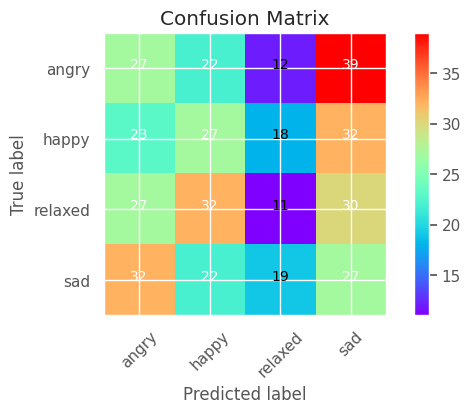

In [44]:
# Compute the confusion matrix
true_labels = test_generator1.classes
augment_model = confusion_matrix(true_labels, predictor)

# Define the class labels
labels = ['angry', 'happy', 'relaxed', 'sad']

# Plot the confusion matrix
plot_confusion_matrix(cm=augment_model, classes=labels)

In [45]:
print(classification_report(test_generator1.classes,predictor, target_names=labels))

              precision    recall  f1-score   support

       angry       0.25      0.27      0.26       100
       happy       0.26      0.27      0.27       100
     relaxed       0.18      0.11      0.14       100
         sad       0.21      0.27      0.24       100

    accuracy                           0.23       400
   macro avg       0.23      0.23      0.22       400
weighted avg       0.23      0.23      0.22       400



In [46]:
# Clearing backend
from tensorflow.keras import backend
backend.clear_session()

# Fixing the seed for random number generators
import random
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

## Transfer learning Models

### ResNet-50

In [47]:
# Load the ResNet50 model with ImageNet weights, without the top classification layer
res_net_model= ResNet50(weights='imagenet', include_top=False, input_shape=(200, 200, 3))

In [48]:
# freeze the layers
for layer in res_net_model.layers:
    layer.trainable = False

In [49]:
# Use the output from the dense_model
x = res_net_model.output

# Add GlobalAveragePooling2D layer
x = GlobalAveragePooling2D()(x)

# Add first Dense layer with 1024 units and ReLU activation
x = Dense(1024, activation='relu')(x)

# Add a BatchNormalization layer
x = BatchNormalization()(x)

# Add a Dropout layer for regularization (prevent overfitting)
x = Dropout(0.2)(x)  # You can adjust the dropout rate if needed

# Add another Dense layer with 512 units and ReLU activation
x = Dense(512, activation='relu')(x)

# Add a BatchNormalization layer
x = BatchNormalization()(x)

# Add another Dropout layer
x = Dropout(0.3)(x)

# Final Dense layer for predictions with 4 units and softmax activation
predictions = Dense(4, activation='softmax')(x)

# Construct the final model
resmodel = Model(inputs=res_net_model.input, outputs=predictions)

In [50]:
# Compile the model
resmodel.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=METRICS)


In [51]:
# Define model checkpoint and early stopping
model_filename = "/content/drive/MyDrive/Dogs/Models/dog_res_model.hdf5"
chkpt_r = ModelCheckpoint(model_filename, save_best_only=True, verbose=2)

# define early stopping layer
es = EarlyStopping(patience=3, monitor="val_loss", mode="min", verbose=2)

In [52]:
history = resmodel.fit(train_generator1,
                    epochs=30,
                    steps_per_epoch=train_generator1.samples // batch_size,
                    validation_data=validation_generator1,
                    validation_steps=validation_generator1.samples // batch_size,
                    callbacks=[chkpt_r, es])

Epoch 1/30
40/40 [==============================] - ETA: 0s - loss: 1.8789 - accuracy: 0.6943 - precision: 0.2943 - recall: 0.1595 - auc: 0.5482
Epoch 1: val_loss improved from inf to 1.43971, saving model to /content/drive/MyDrive/Dogs/Models/dog_res_model.hdf5
40/40 [==============================] - 65s 1s/step - loss: 1.8789 - accuracy: 0.6943 - precision: 0.2943 - recall: 0.1595 - auc: 0.5482 - val_loss: 1.4397 - val_accuracy: 0.7500 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.5126
Epoch 2/30
40/40 [==============================] - ETA: 0s - loss: 1.7126 - accuracy: 0.7015 - precision: 0.3390 - recall: 0.2043 - auc: 0.5722
Epoch 2: val_loss improved from 1.43971 to 1.41403, saving model to /content/drive/MyDrive/Dogs/Models/dog_res_model.hdf5
40/40 [==============================] - 52s 1s/step - loss: 1.7126 - accuracy: 0.7015 - precision: 0.3390 - recall: 0.2043 - auc: 0.5722 - val_loss: 1.4140 - val_accuracy: 0.7504 - val_precision: 1.0000 - val_recall: 0

In [53]:
# Evaluate the model using the test generator
evaluation_results = resmodel.evaluate(test_generator1, verbose=1)

7/7 [==============================] - 2s 248ms/step - loss: 1.3755 - accuracy: 0.7531 - precision: 0.7273 - recall: 0.0200 - auc: 0.5869


In [54]:
# Create a DataFrame from the history object
history_df = pd.DataFrame(history.history)

# Print the DataFrame
history_df

,loss,accuracy,precision,recall,auc,val_loss,val_accuracy,val_precision,val_recall,val_auc
0,1.878935,0.694257,0.294264,0.159459,0.548244,1.439708,0.750000,0.000000,0.000000,0.512627
1,1.712596,0.701465,0.338950,0.204297,0.572186,1.414029,0.750391,1.000000,0.001563,0.533562
2,1.691592,0.706445,0.343399,0.191016,0.578100,1.410918,0.750000,0.000000,0.000000,0.530369
3,1.672252,0.707812,0.354447,0.205469,0.589161,1.402128,0.750000,0.000000,0.000000,0.541121
4,1.643407,0.715234,0.380376,0.221094,0.599769,1.388369,0.750781,0.600000,0.009375,0.545081
5,1.607079,0.716895,0.382699,0.216016,0.605855,1.392407,0.754297,1.000000,0.017188,0.544321
6,1.608131,0.712891,0.364865,0.200391,0.603452,1.408694,0.754297,0.866667,0.020312,0.565114
7,1.578773,0.716797,0.378571,0.207031,0.605448,1.389638,0.751953,1.000000,0.007812,0.569976


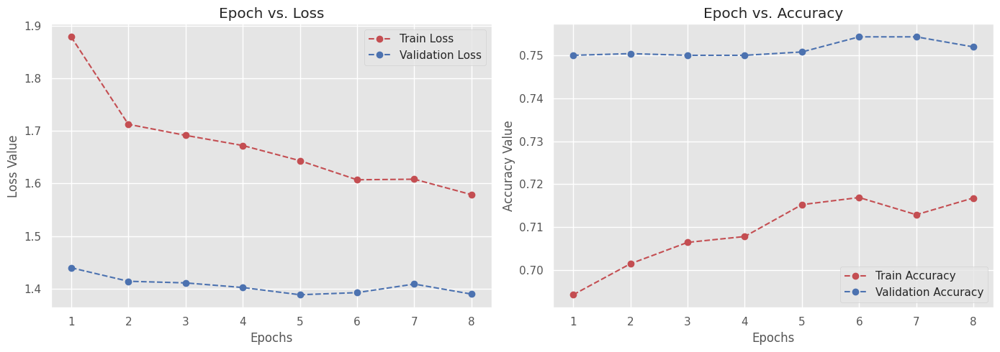

In [55]:
# Plot the accuracy and loss curves
visualize_learning(history, save_path='/content/drive/MyDrive/Dogs/learning_curves/resnet_model_learning_curves.png')

In [56]:
predictor = resmodel.predict(x = test_generator1, verbose=0)
predictor = np.argmax(predictor, axis = 1)

Confusion matrix, without normalization
[[35 49 15  1]
 [32 43 19  6]
 [35 44 13  8]
 [33 48 17  2]]


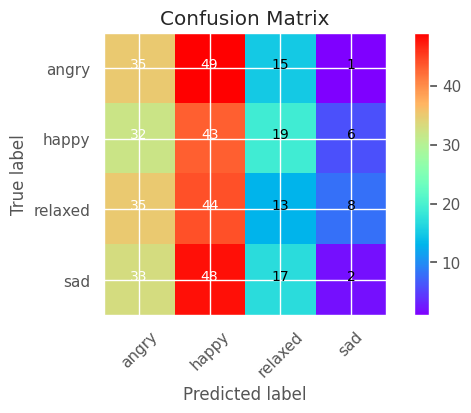

In [57]:
# Compute the confusion matrix
true_labels = test_generator1.classes
resmodel_0 = confusion_matrix(true_labels, predictor)

# Define the class labels
labels = ['angry', 'happy', 'relaxed', 'sad']

# Plot the confusion matrix
plot_confusion_matrix(cm=resmodel_0, classes=labels)

In [58]:
print(classification_report(test_generator1.classes,predictor, target_names=labels))

              precision    recall  f1-score   support

       angry       0.26      0.35      0.30       100
       happy       0.23      0.43      0.30       100
     relaxed       0.20      0.13      0.16       100
         sad       0.12      0.02      0.03       100

    accuracy                           0.23       400
   macro avg       0.20      0.23      0.20       400
weighted avg       0.20      0.23      0.20       400



In [59]:
# Clearing backend
from tensorflow.keras import backend
backend.clear_session()

# Fixing the seed for random number generators
import random
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

#### VGG16 Model

In [60]:
# define vgg16
vgg16_model = VGG16(include_top = False, input_shape = (200, 200, 3), weights = "imagenet")

In [61]:
# freeze the layers
for layer in vgg16_model.layers:
    layer.trainable = False

In [62]:
# Use the output from the dense_model
x = vgg16_model.output

# Add GlobalAveragePooling2D layer
x = GlobalAveragePooling2D()(x)

# Add first Dense layer with 1024 units and ReLU activation
x = Dense(1024, activation='relu')(x)

# Add a BatchNormalization layer
x = BatchNormalization()(x)

# Add a Dropout layer for regularization (prevent overfitting)
x = Dropout(0.2)(x)  # You can adjust the dropout rate if needed

# Add another Dense layer with 512 units and ReLU activation
x = Dense(512, activation='relu')(x)

# Add a BatchNormalization layer
x = BatchNormalization()(x)

# Add another Dropout layer
x = Dropout(0.3)(x)

# Final Dense layer for predictions with 4 units and softmax activation
predictions = Dense(4, activation='softmax')(x)

# Construct the final model
vggmodel = Model(inputs=vgg16_model.input, outputs=predictions)

In [63]:
vggmodel.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 200, 200, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 200, 200, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 200, 200, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 100, 100, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 100, 100, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 100, 100, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 50, 50, 128)       0     

In [64]:
vggmodel.compile(optimizer = Adam(learning_rate=0.0001), loss = "categorical_crossentropy", metrics = METRICS)

In [65]:
# Define model checkpoint and early stopping
model_filename = "/content/drive/MyDrive/Dogs/Models/dog_vgg_model.hdf5"
chkpt_v = ModelCheckpoint(model_filename, save_best_only=True, verbose=2)

# define early stopping layer
es = EarlyStopping(patience=3, monitor="val_loss", mode="min", verbose=2)

In [66]:
history = vggmodel.fit(train_generator1,
                    epochs=epochs,
                    steps_per_epoch=train_generator1.samples // batch_size,
                    validation_data=validation_generator1,
                    validation_steps=validation_generator1.samples // batch_size,
                    callbacks=[chkpt_v, es])

Epoch 1/30
40/40 [==============================] - ETA: 0s - loss: 1.7533 - accuracy: 0.7127 - precision: 0.3837 - recall: 0.2463 - auc: 0.6166
Epoch 1: val_loss improved from inf to 1.38264, saving model to /content/drive/MyDrive/Dogs/Models/dog_vgg_model.hdf5
40/40 [==============================] - 58s 1s/step - loss: 1.7533 - accuracy: 0.7127 - precision: 0.3837 - recall: 0.2463 - auc: 0.6166 - val_loss: 1.3826 - val_accuracy: 0.7500 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.5748
Epoch 2/30
40/40 [==============================] - ETA: 0s - loss: 1.5113 - accuracy: 0.7356 - precision: 0.4622 - recall: 0.3512 - auc: 0.6916
Epoch 2: val_loss improved from 1.38264 to 1.36195, saving model to /content/drive/MyDrive/Dogs/Models/dog_vgg_model.hdf5
40/40 [==============================] - 52s 1s/step - loss: 1.5113 - accuracy: 0.7356 - precision: 0.4622 - recall: 0.3512 - auc: 0.6916 - val_loss: 1.3619 - val_accuracy: 0.7500 - val_precision: 0.0000e+00 - val_recal

In [67]:
# Evaluate the model using the test generator
evaluation_results = vggmodel.evaluate(test_generator1, verbose=1)

7/7 [==============================] - 2s 274ms/step - loss: 1.0239 - accuracy: 0.8019 - precision: 0.6426 - recall: 0.4675 - auc: 0.8191


In [68]:
# Create a DataFrame from the history object
history_df = pd.DataFrame(history.history)

# Print the DataFrame
history_df

,loss,accuracy,precision,recall,auc,val_loss,val_accuracy,val_precision,val_recall,val_auc
0,1.753266,0.712669,0.383684,0.246284,0.616621,1.382639,0.750000,0.000000,0.000000,0.574819
1,1.511301,0.735645,0.462211,0.351172,0.691631,1.361950,0.750000,0.000000,0.000000,0.605819
2,1.448976,0.747363,0.493151,0.379687,0.712337,1.339557,0.750781,1.000000,0.003125,0.621145
3,1.366007,0.760352,0.526904,0.405469,0.736637,1.324517,0.753125,1.000000,0.012500,0.633757
4,1.327232,0.761328,0.530526,0.393750,0.739895,1.290169,0.760938,0.868421,0.051562,0.660433
5,1.325813,0.762402,0.532648,0.404687,0.744282,1.244787,0.764063,0.700000,0.098438,0.696238
6,1.300622,0.766211,0.542695,0.412109,0.749633,1.218442,0.763281,0.693182,0.095312,0.714683
7,1.301420,0.761426,0.530580,0.396484,0.749633,1.206895,0.770703,0.646409,0.182812,0.719137
8,1.221899,0.778613,0.575090,0.438281,0.773053,1.173467,0.772656,0.659341,0.187500,0.740569
9,1.264074,0.767285,0.545548,0.414062,0.759490,1.125410,0.782031,0.679825,0.242188,0.768128


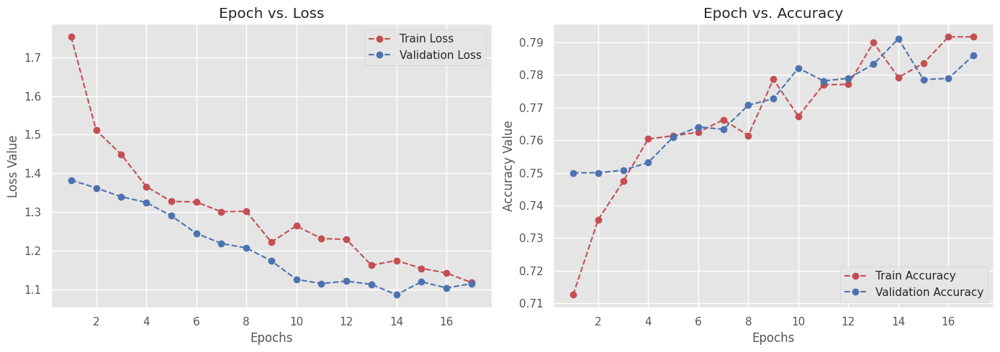

In [69]:
# Plot the accuracy and loss curves
visualize_learning(history, save_path='/content/drive/MyDrive/Dogs/learning_curves/vgg16_model_learning_curves.png')

In [70]:
predictor = vggmodel.predict(x = test_generator1, verbose=0)
predictor = np.argmax(predictor, axis = 1)

Confusion matrix, without normalization
[[18 31 27 24]
 [ 9 32 25 34]
 [12 37 28 23]
 [15 26 37 22]]


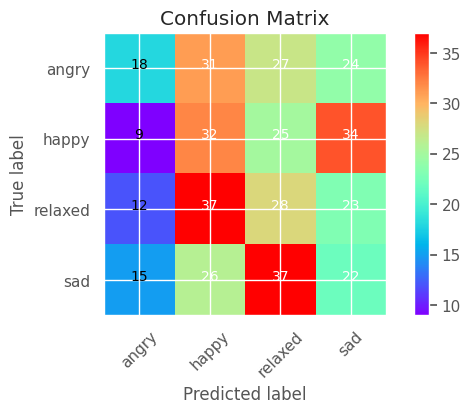

In [71]:
# Compute the confusion matrix
true_labels = test_generator1.classes
vggmodel_0 = confusion_matrix(true_labels, predictor)

# Define the class labels
labels = ['angry', 'happy', 'relaxed', 'sad']

# Plot the confusion matrix
plot_confusion_matrix(cm=vggmodel_0, classes=labels)

In [72]:
print(classification_report(test_generator1.classes,predictor, target_names=labels))

              precision    recall  f1-score   support

       angry       0.33      0.18      0.23       100
       happy       0.25      0.32      0.28       100
     relaxed       0.24      0.28      0.26       100
         sad       0.21      0.22      0.22       100

    accuracy                           0.25       400
   macro avg       0.26      0.25      0.25       400
weighted avg       0.26      0.25      0.25       400



In [73]:
# Clearing backend
from tensorflow.keras import backend
backend.clear_session()

# Fixing the seed for random number generators
import random
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

#### MobileNet Model

In [74]:
# Load the MobileNet model without top layers
mobilenet_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(200, 200, 3))

In [75]:
# Freeze the layers of the MobileNet model
for layer in mobilenet_model.layers:
    layer.trainable = False

In [76]:
# Creating trainable layers
# Use the output from the dense_model
x = mobilenet_model.output

# Add GlobalAveragePooling2D layer
x = GlobalAveragePooling2D()(x)

# Add first Dense layer with 1024 units and ReLU activation
x = Dense(1024, activation='relu')(x)

# Add a BatchNormalization layer
x = BatchNormalization()(x)

# Add a Dropout layer for regularization (prevent overfitting)
x = Dropout(0.2)(x)  # You can adjust the dropout rate if needed

# Add another Dense layer with 512 units and ReLU activation
x = Dense(512, activation='relu')(x)

# Add a BatchNormalization layer
x = BatchNormalization()(x)

# Add another Dropout layer
x = Dropout(0.3)(x)

# Final Dense layer for predictions with 4 units and softmax activation
predictions = Dense(4, activation='softmax')(x)

# Construct the final model
mobilemodel = Model(inputs=mobilenet_model.input, outputs=predictions)

In [77]:
mobilemodel.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 200, 200, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 100, 100, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 100, 100, 32  128         ['Conv1[0][0]']                  
                                )                                                             

In [78]:
mobilemodel.compile(optimizer = Adam(learning_rate=0.0001), loss = "categorical_crossentropy", metrics = METRICS)

In [79]:
# Define model checkpoint and early stopping
model_filename = "/content/drive/MyDrive/Dogs/Models/dog_mobile_model.hdf5"
chkpt_m = ModelCheckpoint(model_filename, save_best_only=True, verbose=2)

# define early stopping layer
es = EarlyStopping(patience=3, monitor="val_loss", mode="min", verbose=2)

In [80]:
history = mobilemodel.fit(train_generator1,
                    epochs=epochs,
                    steps_per_epoch=train_generator1.samples // batch_size,
                    validation_data=validation_generator1,
                    validation_steps=validation_generator1.samples // batch_size,
                    callbacks=[chkpt_m, es])

Epoch 1/30
40/40 [==============================] - ETA: 0s - loss: 1.8020 - accuracy: 0.7178 - precision: 0.4151 - recall: 0.3145 - auc: 0.6509
Epoch 1: val_loss improved from inf to 1.20696, saving model to /content/drive/MyDrive/Dogs/Models/dog_mobile_model.hdf5
40/40 [==============================] - 60s 1s/step - loss: 1.8020 - accuracy: 0.7178 - precision: 0.4151 - recall: 0.3145 - auc: 0.6509 - val_loss: 1.2070 - val_accuracy: 0.7688 - val_precision: 0.6967 - val_recall: 0.1328 - val_auc: 0.7210
Epoch 2/30
40/40 [==============================] - ETA: 0s - loss: 1.4540 - accuracy: 0.7579 - precision: 0.5192 - recall: 0.4270 - auc: 0.7339
Epoch 2: val_loss improved from 1.20696 to 1.13122, saving model to /content/drive/MyDrive/Dogs/Models/dog_mobile_model.hdf5
40/40 [==============================] - 51s 1s/step - loss: 1.4540 - accuracy: 0.7579 - precision: 0.5192 - recall: 0.4270 - auc: 0.7339 - val_loss: 1.1312 - val_accuracy: 0.7738 - val_precision: 0.6245 - val_recall: 0.2

In [81]:
# Evaluate the model using the test generator
evaluation_results = mobilemodel.evaluate(test_generator1, verbose=1)

7/7 [==============================] - 1s 209ms/step - loss: 0.9788 - accuracy: 0.7987 - precision: 0.6300 - recall: 0.4725 - auc: 0.8346


In [82]:
# Create a DataFrame from the history object
history_df = pd.DataFrame(history.history)

# Print the DataFrame
history_df

,loss,accuracy,precision,recall,auc,val_loss,val_accuracy,val_precision,val_recall,val_auc
0,1.802023,0.717821,0.415069,0.314527,0.650915,1.206963,0.768750,0.696721,0.132812,0.720982
1,1.454017,0.757910,0.519240,0.426953,0.733868,1.131223,0.773828,0.624490,0.239063,0.761654
2,1.319536,0.770020,0.548740,0.450781,0.768685,1.111760,0.782812,0.619318,0.340625,0.774490
3,1.186260,0.783301,0.579487,0.485547,0.800841,1.064088,0.791016,0.637795,0.379687,0.797963
4,1.182053,0.796582,0.612024,0.508984,0.805373,1.061590,0.802344,0.661058,0.429688,0.802409
5,1.128372,0.795020,0.606664,0.512109,0.816287,1.014031,0.806250,0.658590,0.467187,0.823495
6,1.114442,0.799023,0.615562,0.522266,0.822473,1.034335,0.798828,0.628337,0.478125,0.818835
7,1.050809,0.809277,0.638269,0.547266,0.838220,1.079692,0.802344,0.632411,0.500000,0.811447
8,1.018509,0.815137,0.653052,0.555859,0.845130,1.056884,0.802344,0.633466,0.496875,0.820988


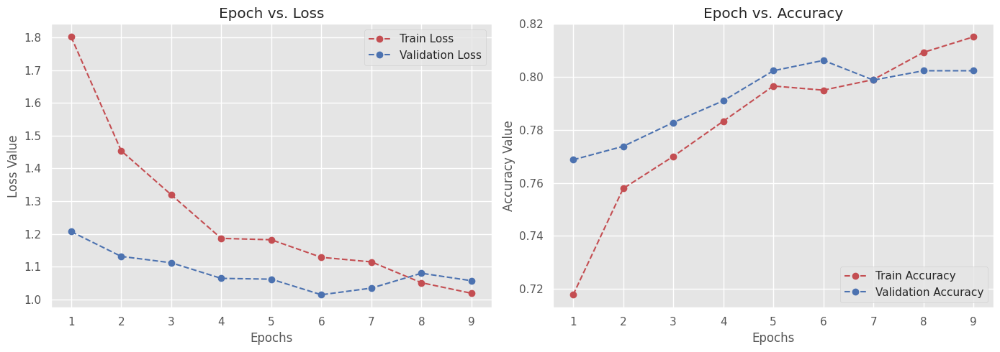

In [83]:
# Plot the accuracy and loss curves
visualize_learning(history, save_path='/content/drive/MyDrive/Dogs/learning_curves/mobilenet_model_learning_curves.png')

In [84]:
predictor = mobilemodel.predict(x = test_generator1, verbose=0)
predictor = np.argmax(predictor, axis = 1)


Confusion matrix, without normalization
[[16 30 26 28]
 [13 34 26 27]
 [14 27 30 29]
 [16 38 25 21]]


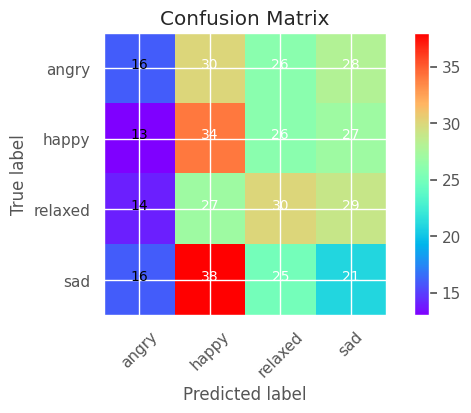

In [85]:
# Compute the confusion matrix
true_labels = test_generator1.classes
mobilemodel_0 = confusion_matrix(true_labels, predictor)

# Define the class labels
labels = ['angry', 'happy', 'relaxed', 'sad']

# Plot the confusion matrix
plot_confusion_matrix(cm=mobilemodel_0, classes=labels)

In [86]:
print(classification_report(test_generator1.classes,predictor, target_names=labels))

              precision    recall  f1-score   support

       angry       0.27      0.16      0.20       100
       happy       0.26      0.34      0.30       100
     relaxed       0.28      0.30      0.29       100
         sad       0.20      0.21      0.20       100

    accuracy                           0.25       400
   macro avg       0.25      0.25      0.25       400
weighted avg       0.25      0.25      0.25       400



In [87]:
# Clearing backend
from tensorflow.keras import backend
backend.clear_session()
import random
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

#### DenseNet121 Model

In [88]:
# Load the DenseNet model with imagenet weights
dense_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(200, 200, 3))

In [89]:
# Freeze all layers of the base model
for layer in dense_model.layers:
    layer.trainable = False


In [90]:
# Creating trainable layers
# Use the output from the dense_model
x = dense_model.output

# Add GlobalAveragePooling2D layer
x = GlobalAveragePooling2D()(x)

# Add first Dense layer with 1024 units and ReLU activation
x = Dense(1024, activation='relu')(x)

# Add a BatchNormalization layer
x = BatchNormalization()(x)

# Add a Dropout layer for regularization (prevent overfitting)
x = Dropout(0.2)(x)  # You can adjust the dropout rate if needed

# Add another Dense layer with 512 units and ReLU activation
x = Dense(512, activation='relu')(x)

# Add a BatchNormalization layer
x = BatchNormalization()(x)

# Add another Dropout layer
x = Dropout(0.3)(x)

# Final Dense layer for predictions with 4 units and softmax activation
predictions = Dense(4, activation='softmax')(x)

# Construct the full model
densemodel = Model(inputs= dense_model.input, outputs=predictions)
densemodel.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 200, 200, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 206, 206, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 100, 100, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                              

In [91]:
# Compile the model
densemodel.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=METRICS)

In [92]:
# Define model checkpoint and early stopping
model_filename = "/content/drive/MyDrive/Dogs/Models/dog_dense1_model.hdf5"
chkpt_dd = ModelCheckpoint(model_filename, save_best_only=True, verbose=2)

# define early stopping layer
es = EarlyStopping(patience=3, monitor="val_loss", mode="min", verbose=2)

In [93]:
history = densemodel.fit(train_generator1,
                    epochs=epochs,
                    steps_per_epoch=train_generator1.samples // batch_size,
                    validation_data=validation_generator1,
                    validation_steps=validation_generator1.samples // batch_size,
                    callbacks=[chkpt_dd, es])

Epoch 1/30
40/40 [==============================] - ETA: 0s - loss: 1.7734 - accuracy: 0.7164 - precision: 0.4094 - recall: 0.3037 - auc: 0.6434
Epoch 1: val_loss improved from inf to 1.17998, saving model to /content/drive/MyDrive/Dogs/Models/dog_dense1_model.hdf5
40/40 [==============================] - 66s 1s/step - loss: 1.7734 - accuracy: 0.7164 - precision: 0.4094 - recall: 0.3037 - auc: 0.6434 - val_loss: 1.1800 - val_accuracy: 0.7754 - val_precision: 0.6585 - val_recall: 0.2109 - val_auc: 0.7395
Epoch 2/30
40/40 [==============================] - ETA: 0s - loss: 1.3944 - accuracy: 0.7546 - precision: 0.5115 - recall: 0.4074 - auc: 0.7392
Epoch 2: val_loss improved from 1.17998 to 1.06680, saving model to /content/drive/MyDrive/Dogs/Models/dog_dense1_model.hdf5
40/40 [==============================] - 54s 1s/step - loss: 1.3944 - accuracy: 0.7546 - precision: 0.5115 - recall: 0.4074 - auc: 0.7392 - val_loss: 1.0668 - val_accuracy: 0.7789 - val_precision: 0.6135 - val_recall: 0.3

In [94]:
# Evaluate the model using the test generator
evaluation_results = densemodel.evaluate(test_generator1, verbose=1)

7/7 [==============================] - 2s 282ms/step - loss: 0.8810 - accuracy: 0.8263 - precision: 0.6784 - recall: 0.5800 - auc: 0.8739


In [95]:
# Create a DataFrame from the history object
history_df = pd.DataFrame(history.history)

# Print the DataFrame
history_df

,loss,accuracy,precision,recall,auc,val_loss,val_accuracy,val_precision,val_recall,val_auc
0,1.773361,0.716385,0.409381,0.303716,0.643430,1.179980,0.775391,0.658537,0.210938,0.739548
1,1.394373,0.754590,0.511525,0.407422,0.739151,1.066804,0.778906,0.613497,0.312500,0.796221
2,1.276955,0.775098,0.560814,0.462891,0.775576,1.061350,0.790234,0.638070,0.371875,0.796149
3,1.210246,0.782812,0.579772,0.476953,0.792427,1.006790,0.792188,0.624424,0.423438,0.820592
4,1.111367,0.803418,0.627268,0.526563,0.821481,1.021100,0.797656,0.628692,0.465625,0.821234
5,1.068654,0.806250,0.633087,0.535156,0.831410,1.019245,0.805469,0.649789,0.481250,0.824827
6,1.050125,0.803711,0.626728,0.531250,0.833862,0.983167,0.809766,0.650888,0.515625,0.838951
7,0.996264,0.816406,0.653846,0.564453,0.850586,0.996628,0.810938,0.647727,0.534375,0.837741
8,0.936031,0.832422,0.690605,0.597266,0.865510,0.977240,0.813672,0.652908,0.543750,0.846069
9,0.914021,0.828027,0.681015,0.587109,0.869684,0.967875,0.817969,0.662921,0.553125,0.849637


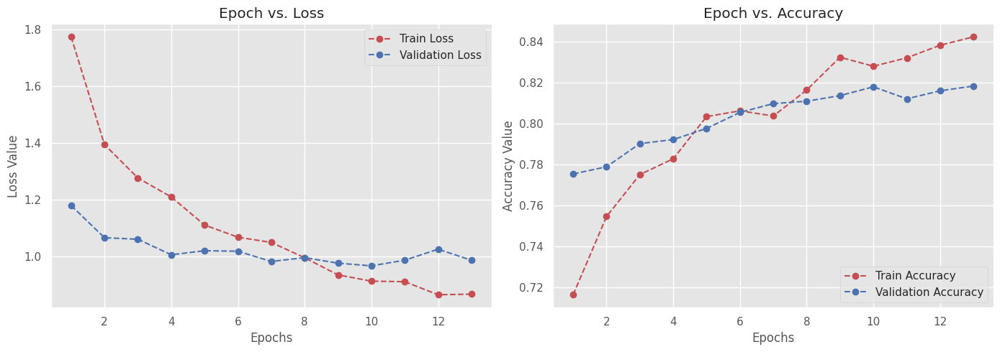

In [96]:
# Plot the accuracy and loss curves
visualize_learning(history, save_path='/content/drive/MyDrive/Dogs/learning_curves/dense_model_learning_curves.png')

In [97]:
predictor = densemodel.predict(x = test_generator1, verbose=0)
predictor = np.argmax(predictor, axis = 1)

Confusion matrix, without normalization
[[16 25 31 28]
 [20 30 21 29]
 [23 31 19 27]
 [22 31 20 27]]


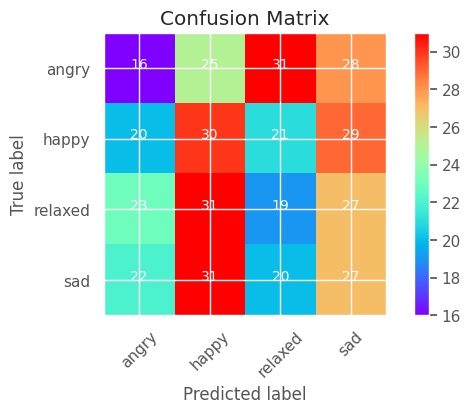

In [98]:
# Compute the confusion matrix
true_labels = test_generator1.classes
densemodel_0 = confusion_matrix(true_labels, predictor)

# Define the class labels
labels = ['angry', 'happy', 'relaxed', 'sad']

# Plot the confusion matrix
plot_confusion_matrix(cm=densemodel_0, classes=labels)

In [99]:
print(classification_report(test_generator1.classes,predictor, target_names=labels))

              precision    recall  f1-score   support

       angry       0.20      0.16      0.18       100
       happy       0.26      0.30      0.28       100
     relaxed       0.21      0.19      0.20       100
         sad       0.24      0.27      0.26       100

    accuracy                           0.23       400
   macro avg       0.23      0.23      0.23       400
weighted avg       0.23      0.23      0.23       400



### Visualize the predictions

2/2 [==============================] - 0s 14ms/step


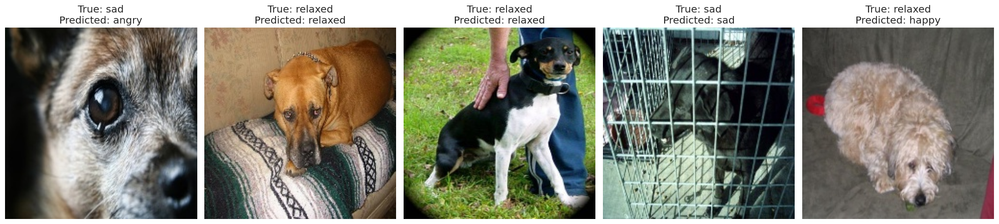

In [100]:
def plot_predictions(model, generator, class_names, num_images=5):
    """
    model: The trained model.
    generator: Data generator.
    class_names: List of class names.
    num_images: Number of images to visualize.
    """



    # Get a batch of data
    images, true_labels = next(generator)



    # Get predictions
    predictions = model.predict(images)
    pred_labels = np.argmax(predictions, axis=1)
    true_labels = np.argmax(true_labels, axis=1)



    # Plotting
    fig, axes = plt.subplots(1, num_images, figsize=(20, 5))
    for i, ax in enumerate(axes):
        ax.imshow(images[i])
        ax.set_title(f"True: {class_names[true_labels[i]]}\nPredicted: {class_names[pred_labels[i]]}")
        ax.axis('off')
    plt.tight_layout()
    plt.show()



# Plot
class_names = list(test_generator.class_indices.keys())  # Get class names from the generator
plot_predictions(base_model, test_generator, class_names, num_images=5)


2/2 [==============================] - 0s 12ms/step


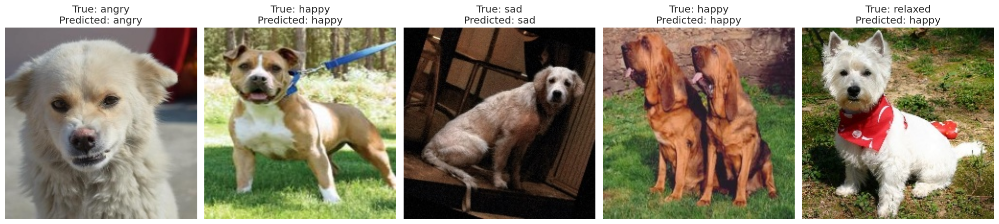

In [101]:
class_names = list(test_generator1.class_indices.keys())  # Get class names from the generator
plot_predictions(augmented_model, test_generator1, class_names, num_images=5)

2/2 [==============================] - 1s 14ms/step


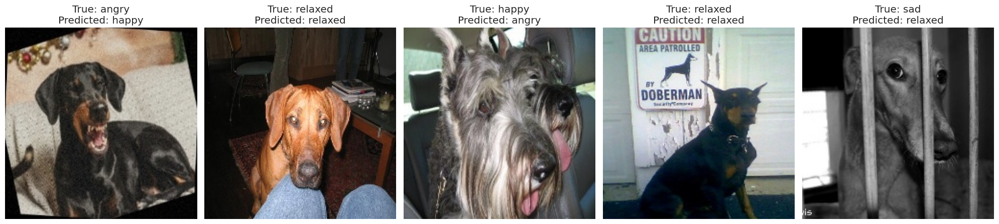

In [102]:
class_names = list(test_generator1.class_indices.keys())  # Get class names from the generator
plot_predictions(resmodel, test_generator1, class_names, num_images=5)

2/2 [==============================] - 1s 15ms/step


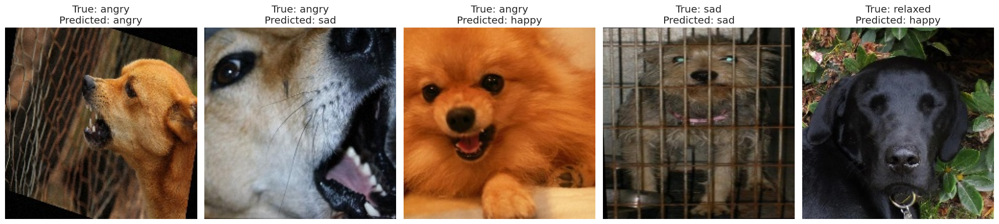

In [103]:
class_names = list(test_generator1.class_indices.keys())  # Get class names from the generator
plot_predictions(vggmodel, test_generator1, class_names, num_images=5)

2/2 [==============================] - 1s 21ms/step


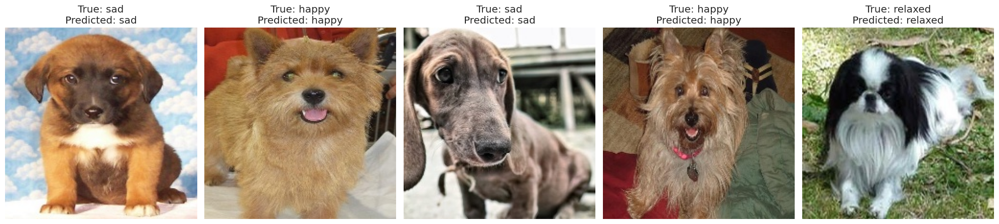

In [104]:
class_names = list(test_generator1.class_indices.keys())  # Get class names from the generator
plot_predictions(mobilemodel, test_generator1, class_names, num_images=5)

2/2 [==============================] - 3s 22ms/step


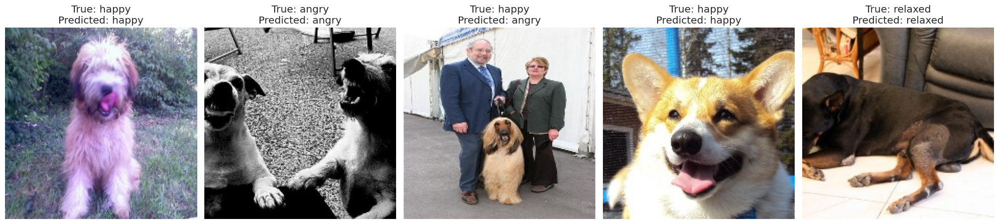

In [105]:
class_names = list(test_generator1.class_indices.keys())  # Get class names from the generator
plot_predictions(densemodel, test_generator1, class_names, num_images=5)

In [3]:
pd.DataFrame({'Models':['Base_CNN_Model','Base_CNN_Tuned with Data Augmentation','Transfer Learning Model(ResNet-50 Model)','Transfer Learning Model(VGG16 Model)','Transfer Learning Model(MobileNet Model)','Transfer Learning Model(DenseNet121 Model)'],'Train Accuracy':['85.26%','75.32%','71.68%','79.16%', '81.51%','84.23%'],'Validation Accuracy':['72.72%','75.23%','75.20%','78.59%', '80.24%','81.84%'],'Test Accuracy':['73.87%','75.81%','75.31%','80.19%', '79.87%','82.63%']})

,Models,Train Accuracy,Validation Accuracy,Test Accuracy
0,Base_CNN_Model,85.26%,72.72%,73.87%
1,Base_CNN_Tuned with Data Augmentation,75.32%,75.23%,75.81%
2,Transfer Learning Model(ResNet-50 Model),71.68%,75.20%,75.31%
3,Transfer Learning Model(VGG16 Model),79.16%,78.59%,80.19%
4,Transfer Learning Model(MobileNet Model),81.51%,80.24%,79.87%
5,Transfer Learning Model(DenseNet121 Model),84.23%,81.84%,82.63%


In [107]:
# NB stack overflow for models